# Notebook to run basic analysis on Raw data before cellbender

# Importing packages

In [21]:
import anndata as ad
import scanpy as sc
import os
import bbknn
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import median_abs_deviation

In [22]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 300, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.8
scanpy      1.10.1
-----
PIL                 10.3.0
annoy               NA
array_api_compat    1.7.1
asttokens           NA
bbknn               1.6.0
cffi                1.16.0
charset_normalizer  3.3.2
colorama            0.4.6
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.2
decorator           5.1.1
defusedxml          0.7.1
django              5.0.6
executing           2.0.1
h5py                3.11.0
igraph              0.11.5
ipykernel           6.29.5
ipython_genutils    0.2.0
ipywidgets          8.1.3
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
llvmlite            0.43.0
matplotlib          3.8.4
matplotlib_inline   0.1.7
mpl_toolkits        NA
natsort             8.4.0
numba               0.60.0
numexpr             2.10.1
numpy               2.0.0
packaging           24.1
pandas       

In [23]:
files = [
    ("heart_mm_nuclei-23-0092_CMC_states_ctl240131.raw.h5ad", "C_scANVI", "cardiomyocytes"),
    ("heart_mm_nuclei-23-0092_scANVI-Lymphoid_states_ctl240527.raw.h5ad", "cell_type", "lymphoid"),
    ("heart_mm_nuclei-23-0092_scANVI-vascular_states_ctl240131.raw.h5ad", "C_scANVI", "vascular states"),
    ("heart_mm_nuclei-23-0092_FB_states_ctl240131.raw.h5ad", "C_scANVI", "fibroblasts"),
    ("heart_mm_nuclei-23-0092_scANVI-Myeloid_states_ctl240502.raw.h5ad", "cell_type", "myeloid"),
]

ref_samples_list = []
base_dir = '../../data/'

for filename, key, broad_category in files:
    file_path = base_dir + filename
    ref_samples = sc.read(file_path) 

    if key in ref_samples.obs.columns:
        ref_samples.obs['cell_type'] = ref_samples.obs[key]  
    else:
        print(f"Warning: '{key}' not found in '{filename}'. No cell type assigned.")

    ref_samples.obs['cell_type-broad'] = broad_category

    ref_samples_list.append(ref_samples)  


ref = ad.concat(ref_samples_list, join='inner', keys=[filename for filename, _, _ in files])
ref

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 147345 × 16060
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'cell_type-broad'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [24]:
ref.obs['cell_type-broad'].value_counts()

cell_type-broad
lymphoid           65544
myeloid            41716
vascular states    22451
fibroblasts         9377
cardiomyocytes      8257
Name: count, dtype: int64

In [25]:
ref.obs['sample'].value_counts()

sample
A10_2               61829
B1_2                24965
A11_2               12068
A12_2                8974
B2_2                 5677
A9_2                 3695
Hashtag9-TotalA      2597
Hashtag1-TotalA      2447
Hashtag4-TotalA      2434
Hashtag2-TotalA      2360
Hashtag7-TotalA      2222
Hashtag5-TotalA      2126
Hashtag12-TotalA     2066
Hashtag11-TotalA     2036
Hashtag3-TotalA      1852
Hashtag15-TotalA     1801
Hashtag10-TotalA     1757
Hashtag6-TotalA      1733
Hashtag8-TotalA      1697
Hashtag14-TotalA     1693
Hashtag13-TotalA     1316
Name: count, dtype: int64

In [26]:
ref.obs

,cell_source,cell_type,donor,n_counts,n_genes,percent_mito,percent_ribo,region,sample,scrublet_score,...,total_counts_ribo,pct_counts_ribo,percent_mt2,percent_chrY,XIST-counts,S_score,G2M_score,_scvi_batch,_scvi_labels,cell_type-broad
ACACTGATCATTATCC-1-A9_2,HIRI-Nuclei,vCM2,A9_2,19942.757483,3851.0,NaN,NaN,NaN,A9_2,NaN,...,6.0,0.040051,0.000267,0.046726,0.0,-0.218301,-0.450239,0.0,2.0,cardiomyocytes
TCTTCCTGTCATAACC-1-A9_2,HIRI-Nuclei,vCM2,A9_2,18663.787312,3577.0,NaN,NaN,NaN,A9_2,NaN,...,10.0,0.067087,0.000268,0.080504,0.0,0.084806,-0.395886,0.0,2.0,cardiomyocytes
ATCTCTAGTTTCAGAC-1-A9_2,HIRI-Nuclei,vCM2,A9_2,19071.693405,3632.0,NaN,NaN,NaN,A9_2,NaN,...,9.0,0.060124,0.000067,0.053444,0.0,-0.352962,-0.206640,0.0,2.0,cardiomyocytes
TGAATGCAGCTCCATA-1-A9_2,HIRI-Nuclei,vCM2,A9_2,19333.201556,3691.0,NaN,NaN,NaN,A9_2,NaN,...,18.0,0.127786,0.001633,0.078092,1.0,-0.159373,-0.494394,0.0,2.0,cardiomyocytes
GCAGCTGCACAAGTGG-1-A9_2,HIRI-Nuclei,vCM2,A9_2,19636.587384,3778.0,NaN,NaN,NaN,A9_2,NaN,...,11.0,0.077876,0.001062,0.028319,0.0,0.351369,-0.141495,0.0,2.0,cardiomyocytes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGAGCGACTGA-1_2-MDX_MPC-1,HIRI-CD45+,MHCII+MØtr,Mdx5,NaN,NaN,NaN,NaN,NaN,Hashtag10-TotalA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,myeloid
TTTGGAGAGGATAATC-1_2-MDX_MPC-1,HIRI-CD45+,TLF+MØ,Mdx3,NaN,NaN,NaN,NaN,NaN,Hashtag8-TotalA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,myeloid
TTTGGAGTCTCGGCTT-1_2-MDX_MPC-1,HIRI-CD45+,MHCII+MØtr,Mdx1,NaN,NaN,NaN,NaN,NaN,Hashtag6-TotalA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,myeloid
TTTGTTGAGATTCGAA-1_2-MDX_MPC-1,HIRI-CD45+,MHCII+MØtr,Mdx4,NaN,NaN,NaN,NaN,NaN,Hashtag9-TotalA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,myeloid


In [27]:
ref.write_h5ad('../../data/ref_annotated_dmd.h5ad')

In [28]:
ref = sc.read_h5ad('../../data/ref_annotated_dmd.h5ad')
ref

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 147345 × 16060
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'cell_type-broad'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [29]:
ref.obs_names_make_unique()
ref

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/utils.py:260: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['AACAAGAAGTTGAATG-1_1-MDX_POOL_NEW-1', 'AACACACTCGGCTGAC-1_1-MDX_POOL_NEW-1', 'AACCTTTAGGTTGGAC-1_1-MDX_POOL_NEW-1', 'AACGTCATCGGTCAGC-1_1-MDX_POOL_NEW-1', 'AATGCCACAATACCCA-1_1-MDX_POOL_NEW-1']
  warnings.warn(


AnnData object with n_obs × n_vars = 147345 × 16060
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'cell_type-broad'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [30]:
samples = ['A9_2','A10_2','A11_2','A12_2','B1_2', 'B2_2']
ref_samples = ref[ref.obs['sample'].isin(samples)]
ref_samples

View of AnnData object with n_obs × n_vars = 117208 × 16060
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'cell_type-broad'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [31]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

is_raw = X_is_raw(ref)
print(is_raw)

False


In [32]:
sc.pp.highly_variable_genes(
    ref_samples,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    batch_key = "sample",
    subset = True
)
ref_samples

extracting highly variable genes


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:72: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:163: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 117208 × 7000
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'cell_type-broad'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [33]:
sc.pp.pca(ref_samples, n_comps = 50, use_highly_variable = True, svd_solver = 'arpack', random_state = 1712)
sc.pp.neighbors(ref_samples, use_rep = "X_pca", n_neighbors = 50, metric = 'minkowski', random_state = 1786)
bbknn_sample = bbknn.bbknn(ref_samples, neighbors_within_batch = 4, batch_key = 'sample', approx = True, copy = True)

computing PCA
    with n_comps=50


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:31)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:43)


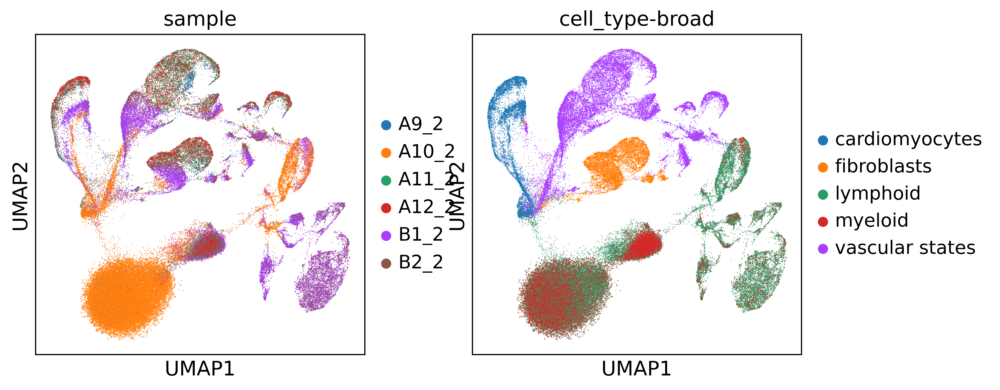

In [34]:
sc.tl.umap(bbknn_sample, min_dist = 0.4, spread = 3, random_state = 1789)
sc.pl.umap(bbknn_sample, color = ['sample', 'cell_type-broad'])

In [41]:
sc.pl.umap(bbknn_sample, color= ['Tnnt2','Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2', 'Cd44'])

In [42]:
genes_of_interest = ['Tnnt2','Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2', 'Cd44']

present_genes = [gene for gene in genes_of_interest if gene in ref_samples.var.index]

ref_samples_interested = ref_samples[:, present_genes].X.sum(axis=0).A1  

counts_df = pd.DataFrame({'Gene': present_genes, 'Total Count': ref_samples_interested})
counts_df

,Gene,Total Count
0,Tnnt2,694179.526369
1,Ttn,359306.809011
2,Dcn,398601.138515
3,Myh7,63130.502709
4,Dmd,115686.349810
5,Ctnna3,79447.692551
6,Lama2,155355.382095
7,Ryr2,132360.573494
8,Cd44,61362.053760


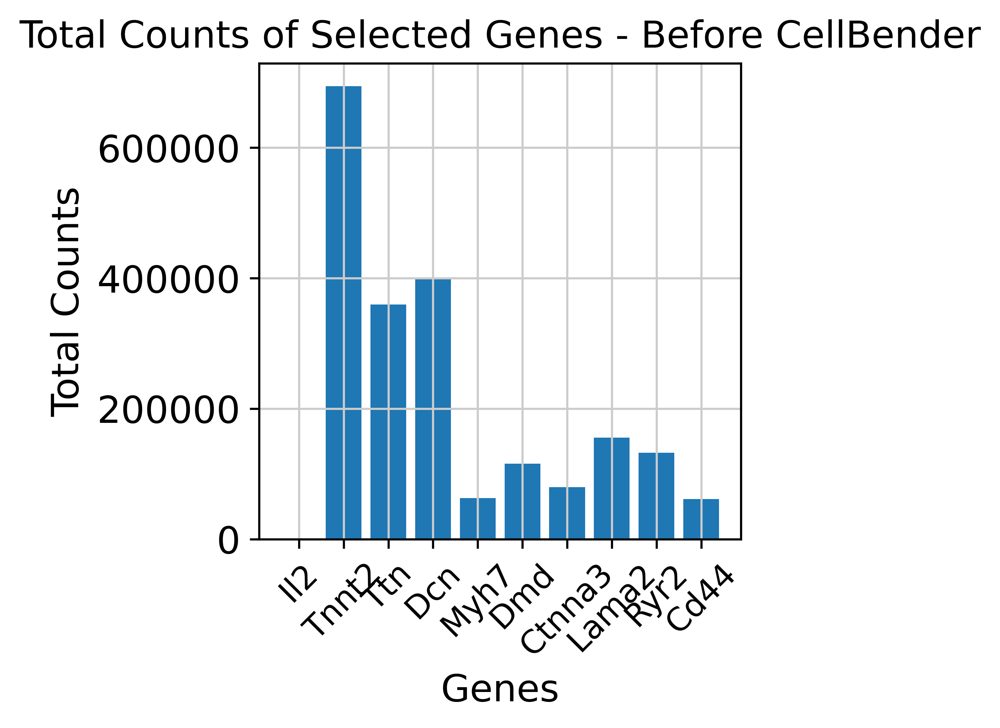

In [37]:
plt.bar(counts_df['Gene'], counts_df['Total Count'])
plt.title('Total Counts of Selected Genes - Before CellBender')
plt.xlabel('Genes')
plt.ylabel('Total Counts')
plt.xticks(rotation=45, fontsize = 12)
plt.tight_layout()
plt.show()

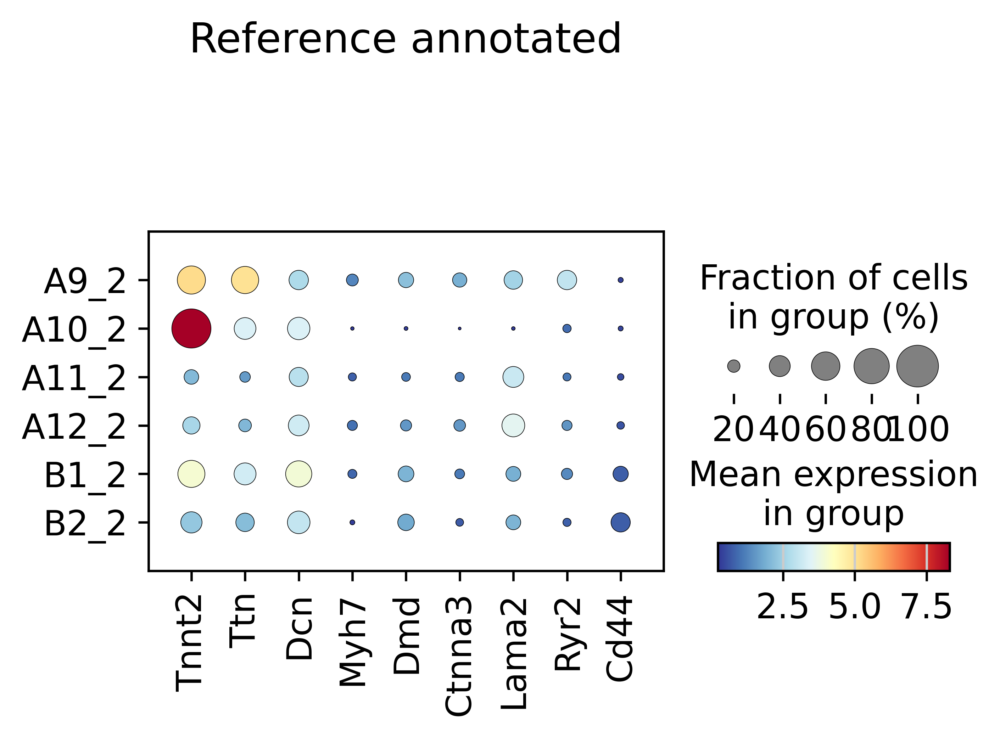

In [43]:
sc.pl.dotplot(ref_samples,  var_names = ['Tnnt2','Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2', 'Cd44'], cmap = 'RdYlBu_r', groupby = 'sample', title = 'Reference annotated')